In [1]:
#1896 - 2016 Olympic Games Analysis
#Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [2]:
#Data exploration
#Data cleaning and manupulation 
#DATA analysis
#Data visualization

In [3]:
#Read the dataSet
athlete = pd.read_csv(r'D:\PROGRAMMING\Programming Python\Devtown\Projects\Project 005\athlete_events.csv')
regions = pd.read_csv(r'D:\PROGRAMMING\Programming Python\Devtown\Projects\Project 005\noc_regions.csv')


In [4]:
#CREting a copy of the dataframe

ath = athlete.copy()
nat = regions.copy()


In [5]:
#Data exploration
print(ath.head())
print('='*50)
ath.tail()

   ID                      Name Sex   Age  Height  Weight            Team  \
0   1                 A Dijiang   M  24.0   180.0    80.0           China   
1   2                  A Lamusi   M  23.0   170.0    60.0           China   
2   3       Gunnar Nielsen Aaby   M  24.0     NaN     NaN         Denmark   
3   4      Edgar Lindenau Aabye   M  34.0     NaN     NaN  Denmark/Sweden   
4   5  Christine Jacoba Aaftink   F  21.0   185.0    82.0     Netherlands   

   NOC        Games  Year  Season       City          Sport  \
0  CHN  1992 Summer  1992  Summer  Barcelona     Basketball   
1  CHN  2012 Summer  2012  Summer     London           Judo   
2  DEN  1920 Summer  1920  Summer  Antwerpen       Football   
3  DEN  1900 Summer  1900  Summer      Paris     Tug-Of-War   
4  NED  1988 Winter  1988  Winter    Calgary  Speed Skating   

                              Event Medal  
0       Basketball Men's Basketball   NaN  
1      Judo Men's Extra-Lightweight   NaN  
2           Football Men's

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,NaN
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",NaN
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",NaN
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,NaN
271115,135571,Tomasz Ireneusz ya,M,34.0,185.0,96.0,Poland,POL,2002 Winter,2002,Winter,Salt Lake City,Bobsleigh,Bobsleigh Men's Four,NaN


In [6]:
nat.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [7]:
nat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   NOC     230 non-null    object
 1   region  227 non-null    object
 2   notes   21 non-null     object
dtypes: object(3)
memory usage: 5.5+ KB


In [8]:
ath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [9]:
ath.describe()

,ID,Age,Height,Weight,Year
count,271116.000000,261642.000000,210945.000000,208241.000000,271116.000000
mean,68248.954396,25.556898,175.338970,70.702393,1978.378480
std,39022.286345,6.393561,10.518462,14.348020,29.877632
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34643.000000,21.000000,168.000000,60.000000,1960.000000
50%,68205.000000,24.000000,175.000000,70.000000,1988.000000
75%,102097.250000,28.000000,183.000000,79.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


In [10]:
ath.shape

(271116, 15)

In [11]:
ath.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [12]:
ath['Medal'].value_counts()

Medal
Gold      13372
Bronze    13295
Silver    13116
Name: count, dtype: int64

In [13]:
# Data cleaning and manupulation
#1. Add region to the ath dataframe AND the region coloumn should have the same name as the NOC coloumn of nat dataframe
# merge the two dataframes

# Create the 'region' column in ath dataframe by merging with nat dataframe and replace it with the 'NOC' column
#METHOD 1
# ath['NOC'] = ath['NOC'].map(nat.set_index('NOC')['region']) #map the NOC coloumn of ath dataframe with the region coloumn of nat dataframe

# ath.rename(columns={'NOC':'region'}, inplace=True)
#METHOD 2
# NOTE: The above method will replace the NOC coloumn with the region coloumn
# NOTE: The below method will add the region coloumn to the dataframe
# NOTE: Always use the below method , as it is the best practice
# NOTE: .map() is used to map the values of the first dataframe with the values of the second dataframe
# NOTE: .set_index() is used to set the index of the second dataframe to the coloumn that we want to map with the first dataframe
# NOTE: .insert() is used to insert the new coloumn at the specified index

region_col = ath['NOC'].map(nat.set_index('NOC')['region'])
ath.insert(7, 'region', region_col) #insert the region coloumn at index 7


In [14]:
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,region,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,Denmark,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [15]:
# drop the NOC coloumn
ath.drop(columns='NOC', inplace=True)
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,region,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,China,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,China,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,Denmark,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,Denmark,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,Netherlands,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [16]:
# Check for null values
# replace all the missing values with their respective mean values(for age ,weight and height)
ath.isnull().sum()


ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
region       370
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [17]:
ath['Age'].fillna(ath['Age'].mean().__round__(0), inplace=True)
ath['Height'].fillna(ath['Height'].mean(), inplace=True)
ath['Weight'].fillna(ath['Weight'].mean(), inplace=True)

C:\Users\Vipul\AppData\Local\Temp\ipykernel_22232\2636683079.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ath['Age'].fillna(ath['Age'].mean().__round__(0), inplace=True)
C:\Users\Vipul\AppData\Local\Temp\ipykernel_22232\2636683079.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a

In [18]:
ath['Age'] = ath['Age'].astype(int)

In [19]:
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,region,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24,180.00000,80.000000,China,China,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23,170.00000,60.000000,China,China,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24,175.33897,70.702393,Denmark,Denmark,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34,175.33897,70.702393,Denmark/Sweden,Denmark,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21,185.00000,82.000000,Netherlands,Netherlands,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [20]:
# Again check for null values
ath.isnull().sum()

ID             0
Name           0
Sex            0
Age            0
Height         0
Weight         0
Team           0
region       370
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [21]:
# list out all the values of the region coloumn where the values are null
ath[ath['region'].isnull()]

,ID,Name,Sex,Age,Height,Weight,Team,region,Games,Year,Season,City,Sport,Event,Medal
578,332,Zarinah Abdullah,F,21,175.33897,70.702393,Singapore,NaN,1992 Summer,1992,Summer,Barcelona,Badminton,Badminton Women's Singles,NaN
579,332,Zarinah Abdullah,F,25,175.33897,70.702393,Singapore,NaN,1996 Summer,1996,Summer,Atlanta,Badminton,Badminton Women's Singles,NaN
2719,1515,Saiyidah Aisyah Mohamed Rafa'ee,F,28,173.00000,68.000000,Singapore,NaN,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Single Sculls,NaN
6267,3515,Paulo Amotun Lokoro,M,24,170.00000,61.000000,Refugee Olympic Athletes,NaN,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,"Athletics Men's 1,500 metres",NaN
7659,4264,Ang Peng Siong,M,21,180.00000,75.000000,Singapore,NaN,1984 Summer,1984,Summer,Los Angeles,Swimming,Swimming Men's 100 metres Freestyle,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268752,134454,Zhang Guirong,F,26,182.00000,95.000000,Singapore,NaN,2004 Summer,2004,Summer,Athina,Athletics,Athletics Women's Shot Put,NaN
268753,134454,Zhang Guirong,F,30,182.00000,95.000000,Singapore,NaN,2008 Summer,2008,Summer,Beijing,Athletics,Athletics Women's Shot Put,NaN
268993,134587,Zhang Xueling,F,21,163.00000,53.000000,Singapore,NaN,2004 Summer,2004,Summer,Athina,Table Tennis,Table Tennis Women's Singles,NaN
268994,134587,Zhang Xueling,F,21,163.00000,53.000000,Singapore-1,NaN,2004 Summer,2004,Summer,Athina,Table Tennis,Table Tennis Women's Doubles,NaN


In [22]:
nat.where(nat['region'] == 'Singapore')

,NOC,region,notes
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
225,NaN,NaN,NaN
226,NaN,NaN,NaN
227,NaN,NaN,NaN
228,NaN,NaN,NaN


In [23]:
#Handling the null values in the column name Medal
ath['Medal'].value_counts()

Medal
Gold      13372
Bronze    13295
Silver    13116
Name: count, dtype: int64

In [24]:
# replace nan with 0, gold with 1, silver with 2 and bronze with 3
ath['Medal'].fillna('0', inplace=True)
ath['Medal'].replace({'Gold':1, 'Silver':2, 'Bronze':3}, inplace=True)
ath['Medal'] = ath['Medal'].astype(int)
ath['Medal'].value_counts()


C:\Users\Vipul\AppData\Local\Temp\ipykernel_22232\2079926995.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ath['Medal'].fillna('0', inplace=True)


Medal
0    231333
1     13372
3     13295
2     13116
Name: count, dtype: int64

In [25]:
#Drop the unwanted columns from the dataframe "Games","region"
ath.drop(columns=['Games','region'], inplace=True)
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24,180.00000,80.000000,China,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,0
1,2,A Lamusi,M,23,170.00000,60.000000,China,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,0
2,3,Gunnar Nielsen Aaby,M,24,175.33897,70.702393,Denmark,1920,Summer,Antwerpen,Football,Football Men's Football,0
3,4,Edgar Lindenau Aabye,M,34,175.33897,70.702393,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,1
4,5,Christine Jacoba Aaftink,F,21,185.00000,82.000000,Netherlands,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,0


In [26]:
# 7. Remove the unwanted phases from the 'Event' coloumn

ath['Event'] = ath.apply(lambda row: re.sub(f'^{row["Sport"]}\\s', '', row['Event']), axis=1)


In [27]:
ath.head()

,ID,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24,180.00000,80.000000,China,1992,Summer,Barcelona,Basketball,Men's Basketball,0
1,2,A Lamusi,M,23,170.00000,60.000000,China,2012,Summer,London,Judo,Men's Extra-Lightweight,0
2,3,Gunnar Nielsen Aaby,M,24,175.33897,70.702393,Denmark,1920,Summer,Antwerpen,Football,Men's Football,0
3,4,Edgar Lindenau Aabye,M,34,175.33897,70.702393,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Men's Tug-Of-War,1
4,5,Christine Jacoba Aaftink,F,21,185.00000,82.000000,Netherlands,1988,Winter,Calgary,Speed Skating,Women's 500 metres,0


In [28]:
ath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 13 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     271116 non-null  int32  
 4   Height  271116 non-null  float64
 5   Weight  271116 non-null  float64
 6   Team    271116 non-null  object 
 7   Year    271116 non-null  int64  
 8   Season  271116 non-null  object 
 9   City    271116 non-null  object 
 10  Sport   271116 non-null  object 
 11  Event   271116 non-null  object 
 12  Medal   271116 non-null  int32  
dtypes: float64(2), int32(2), int64(2), object(7)
memory usage: 24.8+ MB


In [29]:
# Exporting the cleaned dataset

#Export the cleaned dataset to a new csv file
ath.to_csv('Athlete_cleaned_csv.csv')

#Export the cleaned dataset to a new json file
ath.to_json('Athlete_cleaned_json.json')

#Export the cleaned dataset to a new excel file
ath.to_excel('Athlete_cleaned_excel.xlsx')

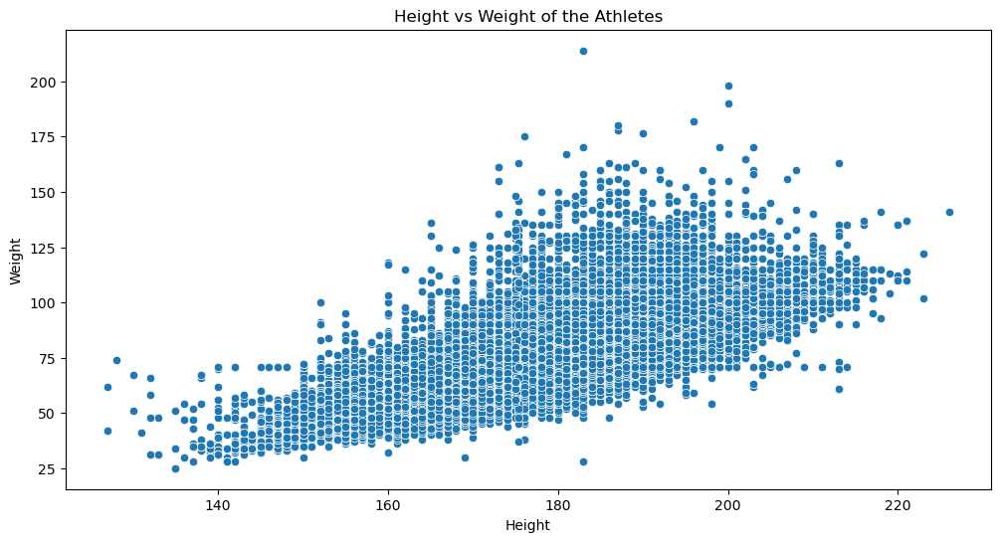

In [30]:
# Analysis part
#1. show the relationship between height and weight of the athletes

plt.figure(figsize=(12,6))
sns.scatterplot(x='Height', y='Weight', data=ath)
plt.title('Height vs Weight of the Athletes')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.show()
# conclusion
# positive correlation between height and weight
# there are some outliers in the data

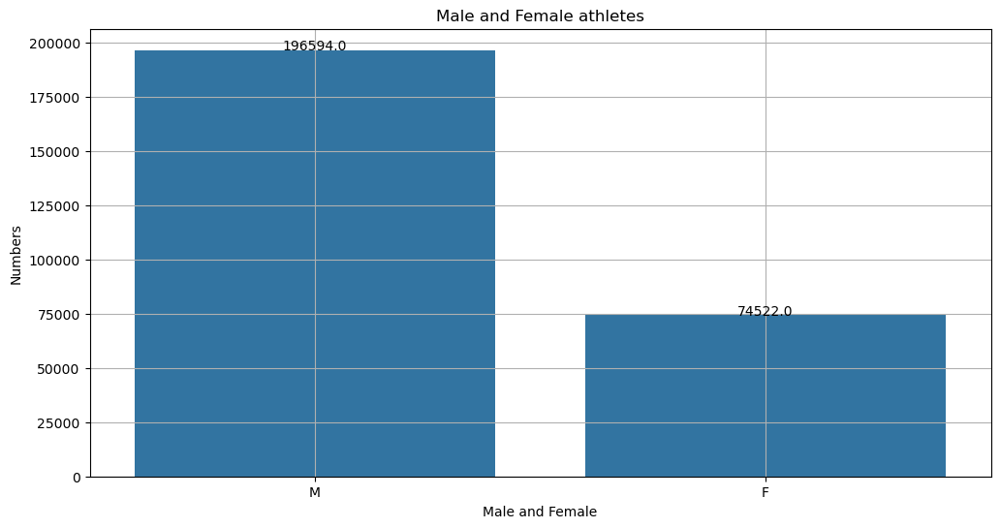

In [31]:
# 2. How many male and female athletes had participated in the olympics during the period 1896-2016
# also display the count on each bar
plt.figure(figsize=(12,6))
sns.countplot(x='Sex', data=ath)
plt.title('Male and Female athletes')
plt.xlabel('Male and Female')
plt.ylabel('Numbers')
plt.grid()
# Display the count on each bar
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')

plt.show()




C:\Users\Vipul\AppData\Local\Temp\ipykernel_22232\3672560502.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='Sex', data=ath, palette='coolwarm')


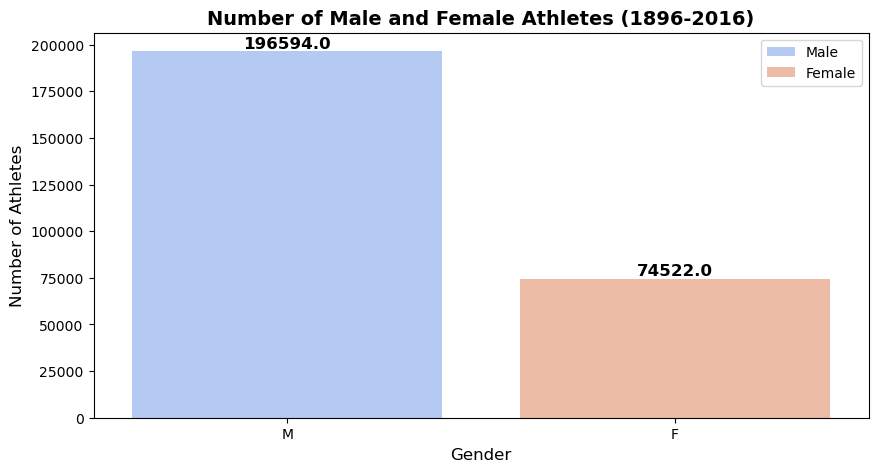

In [32]:

plt.figure(figsize=(10,5))
ax = sns.countplot(x='Sex', data=ath, palette='coolwarm')

plt.title('Number of Male and Female Athletes (1896-2016)', fontsize=14, fontweight='bold')
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Number of Athletes', fontsize=12)

# Add count labels directly inside the loop
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width()/2, p.get_height()), 
                ha='center', va='bottom', fontsize=12, fontweight='bold', color='black')

plt.legend(['Male', 'Female'])

plt.show()


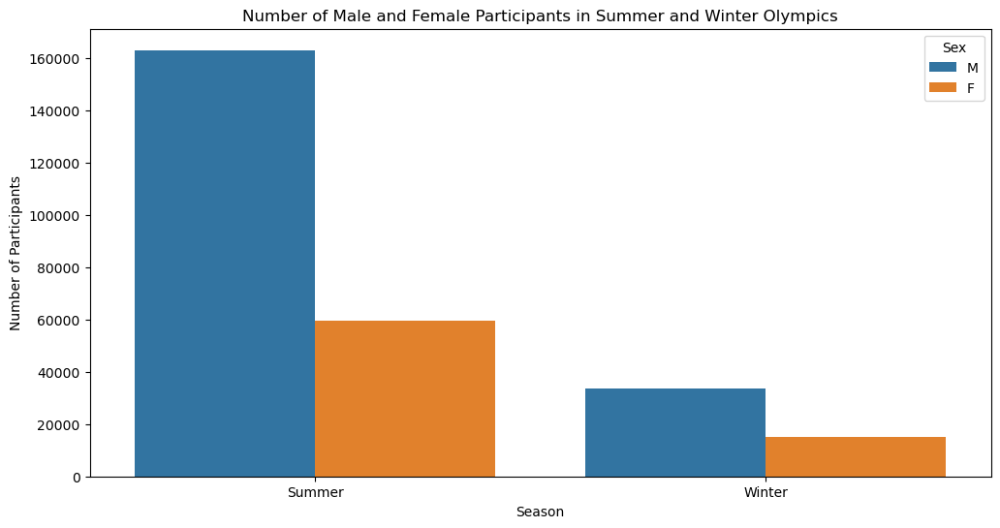

In [33]:
#How many male and female have participated in summer and winter Olympics

plt.figure(figsize=(12,6))
sns.countplot(x='Season', hue='Sex', data=ath)
plt.title('Number of Male and Female Participants in Summer and Winter Olympics')
plt.xlabel('Season')
plt.ylabel('Number of Participants')
plt.show()

[0 1]


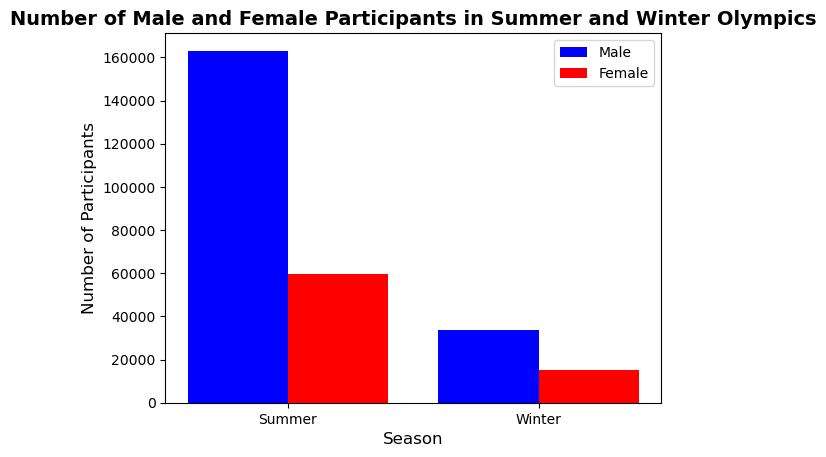

In [34]:
# Count occurrences of 'Sex' for each 'Season'
season_counts = ath.groupby(['Season', 'Sex']).size().unstack()

# Define bar width and positions
bar_width = 0.4
index = np.arange(len(season_counts))
print(index)

# Create the bar plot without plt.figure()
plt.bar(index, season_counts['M'], width=bar_width, label='Male', color='blue')
plt.bar(index + bar_width, season_counts['F'], width=bar_width, label='Female', color='red')

# Labels and title
plt.title('Number of Male and Female Participants in Summer and Winter Olympics', fontsize=14, fontweight='bold')
plt.xlabel('Season', fontsize=12)
plt.ylabel('Number of Participants', fontsize=12)
plt.xticks(index + bar_width / 2, season_counts.index)  # Set x-ticks at center of bars

# Add legend
plt.legend()

plt.show()


Season  Sex
Summer  M      163109
        F       59443
Winter  M       33485
        F       15079
Name: count, dtype: int64


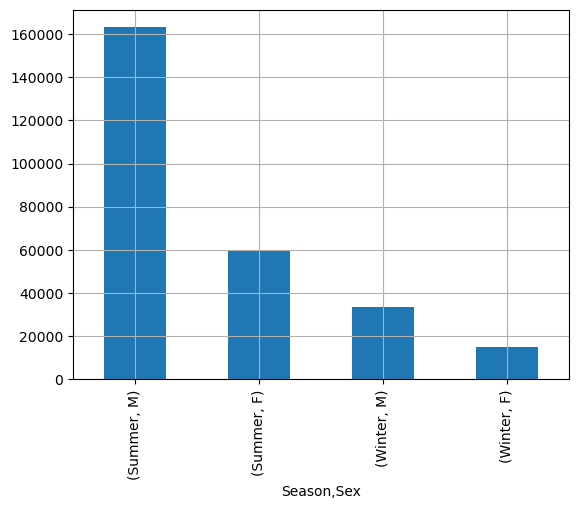

In [35]:
print(ath['Sex'].groupby(ath['Season']).value_counts())
ath['Sex'].groupby(ath['Season']).value_counts().plot.bar(ath['Sex'])
plt.grid()
plt.show()

In [40]:
import plotly.express as px
fig = px.histogram(ath, x='Season', color='Sex',barmode='group',color_discrete_map={'M':'#0080ff','F':'#ff00ff'})
fig.show()


In [45]:
ath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 13 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     271116 non-null  int32  
 4   Height  271116 non-null  float64
 5   Weight  271116 non-null  float64
 6   Team    271116 non-null  object 
 7   Year    271116 non-null  int64  
 8   Season  271116 non-null  object 
 9   City    271116 non-null  object 
 10  Sport   271116 non-null  object 
 11  Event   271116 non-null  object 
 12  Medal   271116 non-null  int32  
dtypes: float64(2), int32(2), int64(2), object(7)
memory usage: 24.8+ MB


In [58]:
# Name the top 5 countries that have the most number of medals
# top_5_countries = ath[ath['Medal'] > 0]['Team'].value_counts().head()
# print(top_5_countries)    
top_5_countries = ath.groupby('Team')['Medal'].sum().sort_values(ascending=False).head()
print(top_5_countries)


Team
United States    9197
Soviet Union     4521
Germany          3967
Great Britain    3399
France           3222
Name: Medal, dtype: int32


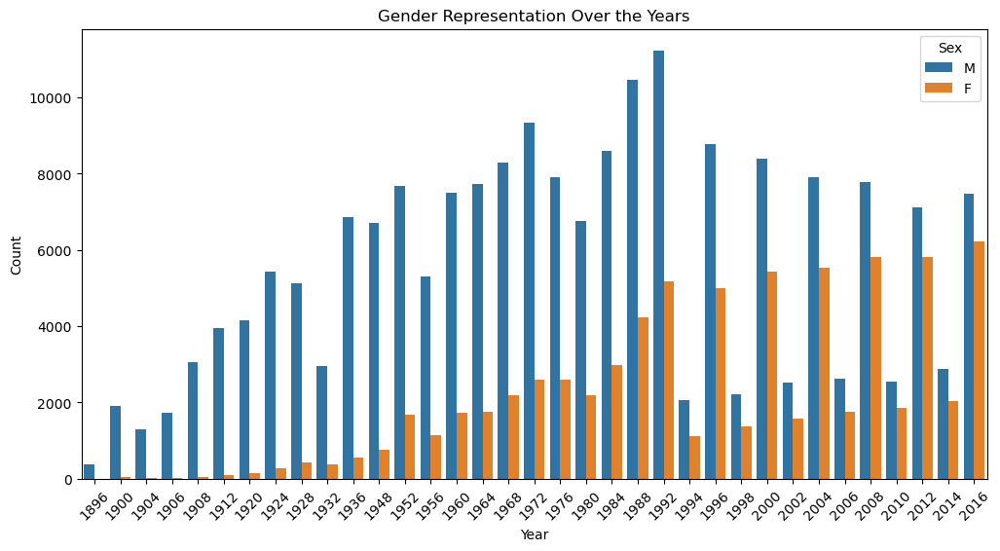

In [82]:
# Gender Representation Over the Years
plt.figure(figsize=(12,6))
sns.countplot(x='Year', hue='Sex', data=ath)
plt.title('Gender Representation Over the Years')
plt.xlabel('Year')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.show()

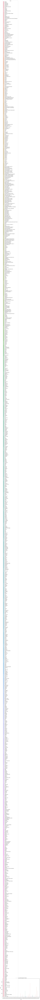

In [84]:
#Country-wise Participation Trends
plt.figure(figsize=(12,6))
sns.countplot(x='Year', hue='Team', data=ath)
plt.title('Country-wise Participation Trends')
plt.xlabel('Year')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.show()

In [76]:
# print((ath['Age'] == 'F').count())
x = ath[ath['Sex'] == 'F']['Sex']
fig = px.histogram(ath[ath['Sex'] == 'F']['Sex'], x = ath['Year'])
fig.show()

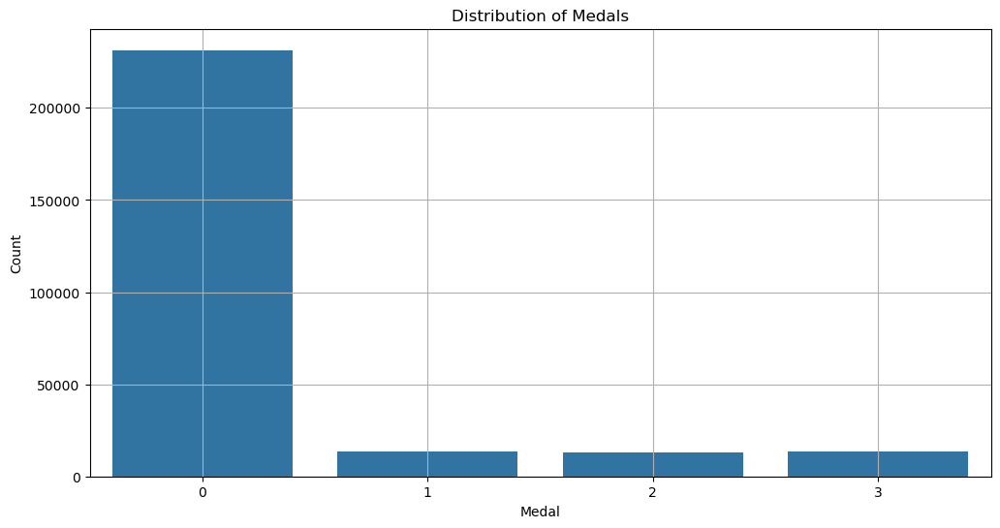

In [78]:
# Medal Distribution
plt.figure(figsize=(12,6))
sns.countplot(x='Medal', data=ath)
plt.title('Distribution of Medals')
plt.xlabel('Medal')
plt.ylabel('Count')
plt.grid()
plt.show()

C:\Users\Vipul\AppData\Local\Temp\ipykernel_22232\1400232702.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




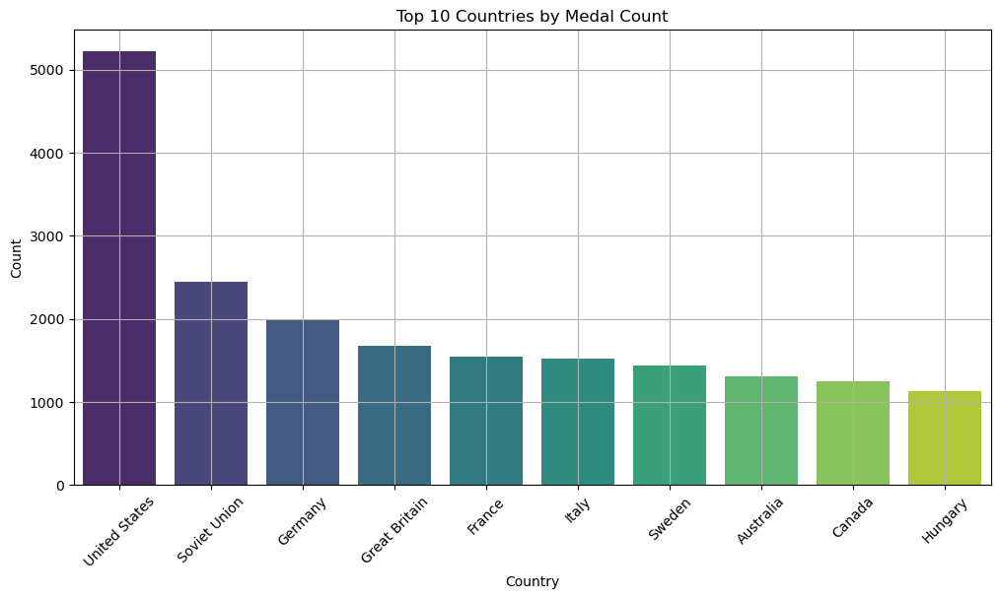

In [80]:

# Top 10 Countries by Medal Count
plt.figure(figsize=(12,6))
top_10_countries = ath[ath['Medal'] > 0]['Team'].value_counts().head(10)
sns.barplot(x=top_10_countries.index, y=top_10_countries, palette='viridis')
plt.title('Top 10 Countries by Medal Count')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()